# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('data/vehicles.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [4]:
df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [5]:
def print_df_info(df):
    print('total rows={}'.format(len(df)))
    rows = []
    for col in df:
        num_unique = df[col].unique().size
        unique_values = df[col].unique() if num_unique < 20 else np.random.choice(df[col].unique(), 10)
        rows.append([col, df[col].dtypes, df[col].isnull().sum(), df[col].unique().size, unique_values])
    
    print(pd.DataFrame(rows, columns=['column','dtype','num_null','num_unique','unique_values']))

print_df_info(df)

total rows=426880
          column    dtype  num_null  num_unique  \
0             id    int64         0      426880   
1         region   object         0         404   
2          price    int64         0       15655   
3           year  float64      1205         115   
4   manufacturer   object     17646          43   
5          model   object      5277       29650   
6      condition   object    174104           7   
7      cylinders   object    177678           9   
8           fuel   object      3013           6   
9       odometer  float64      4400      104871   
10  title_status   object      8242           7   
11  transmission   object      2556           4   
12           VIN   object    161042      118247   
13         drive   object    130567           4   
14          size   object    306361           5   
15          type   object     92858          14   
16   paint_color   object    130203          13   
17         state   object         0          51   

            

In [6]:
df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [7]:
type(df['model'].unique())

numpy.ndarray

In [8]:
def correlation_with_make_model(col):
    print('-------------------------------------')
    print('Exploring the column "{}" with total number of null values = {}'.format(col, df[col].isnull().sum()))
    # df_short
    if col == 'manufacturer':
        df_short = df[['id','model',col]].dropna(subset=['model',col]).reset_index(drop=True)
        df_short['make_model'] = df_short['model'].astype(str)
    else:
        df_short = df[['id','manufacturer','model',col]].dropna(subset=['manufacturer','model',col]).reset_index(drop=True)
        df_short['make_model'] = df_short['manufacturer'].astype(str) + df_short['model'].astype(str)
    print(df_short.info())
    df_null = df[pd.isnull(df[col])]
    df_null_model_unique = df_null['model'].nunique()
    df_short_model_unique = df_short['model'].nunique()
    df_null_short_model_diff = len(set(df_null['model'].unique()).difference(set(df_short['model'].unique())))
    df_null_short_model_common_names = set(df_null['model'].unique()).intersection(set(df_short['model'].unique()))
    df_null_short_model_common = len(df_null_short_model_common_names)
    values_can_be_predicted = len(df_null[df_null['model'].isin(df_null_short_model_common_names)])
    print('df_null unique model = {}, df_short unique model = {}, df_null - df_short unique values = {}, df_null & df_short unique model intersection = {}, num values that can be predicted = {}'.format(df_null_model_unique, df_short_model_unique, df_null_short_model_diff, df_null_short_model_common, values_can_be_predicted))

    # df_model
    df_model = df_short.filter(['make_model'], axis=1).drop_duplicates()
    unique_col = 'unique_{}_per_model'.format(col)
    df_model[unique_col] = df_short.groupby(by=['make_model'])[col].transform('nunique')
    df_model.reset_index(drop=True)
    df_model.plot.hist(bins=50)
    print(df_model.sort_values([unique_col], ascending=False))
    
    print('total make_model = {}'.format(df_model.size))
    df_model.loc[df_model[unique_col]>1]
    df_temp = pd.merge(df_short,df_model.loc[df_model[unique_col]>1],on='make_model').groupby(['make_model',col])['id'].count().reset_index(name="count").sort_values(['make_model','count'], ascending=False)
    df_temp = df_temp.groupby('make_model').agg({'count': lambda x: list(x)})
    df_temp['mean'] = df_temp['count'].apply(np.mean)
    print('make_model with > 1 unique "{}"s = {}'.format(col,df_temp.size))
    print('make_model with mean of count per unique "{}" < 2 = {}'.format(col, df_temp[df_temp['mean']<2].size))
    print(df_temp[df_temp['mean']<2])
# df_temp[df_temp['mean']<50].plot.hist(bins=1000)

-------------------------------------
Exploring the column "drive" with total number of null values = 130567
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283106 entries, 0 to 283105
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            283106 non-null  int64 
 1   manufacturer  283106 non-null  object
 2   model         283106 non-null  object
 3   drive         283106 non-null  object
 4   make_model    283106 non-null  object
dtypes: int64(1), object(4)
memory usage: 10.8+ MB
None
df_null unique model = 12288, df_short unique model = 19410, df_null - df_short unique values = 6984, df_null & df_short unique model intersection = 5305, num values that can be predicted = 101934
                            make_model  unique_drive_per_model
0                        fordf-150 xlt                       3
1468                    hondaaccord ex                       3
5967                toyotaprius hybrid

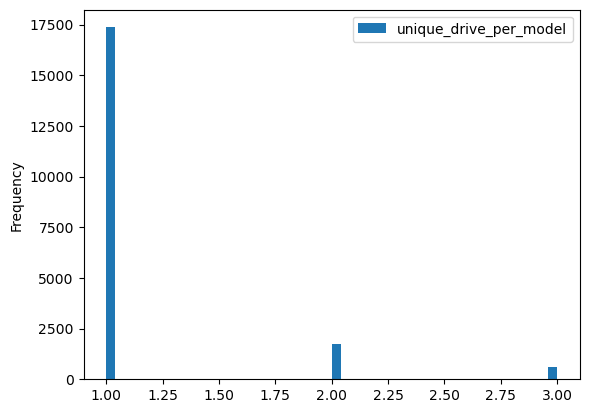

In [9]:
correlation_with_make_model('drive')

-------------------------------------
Exploring the column "size" with total number of null values = 306361
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113476 entries, 0 to 113475
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            113476 non-null  int64 
 1   manufacturer  113476 non-null  object
 2   model         113476 non-null  object
 3   size          113476 non-null  object
 4   make_model    113476 non-null  object
dtypes: int64(1), object(4)
memory usage: 4.3+ MB
None
df_null unique model = 22203, df_short unique model = 10559, df_null - df_short unique values = 16890, df_null & df_short unique model intersection = 5314, num values that can be predicted = 212521
                          make_model  unique_size_per_model
7823             hondainsight hybrid                      4
768                      chrysler200                      4
831                      lexusrx 300            

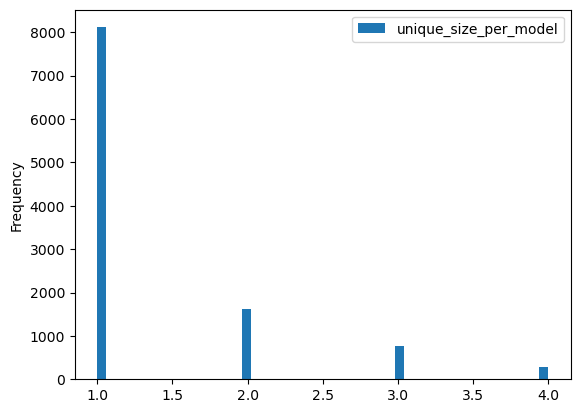

In [10]:
correlation_with_make_model('size')

-------------------------------------
Exploring the column "type" with total number of null values = 92858
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319954 entries, 0 to 319953
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            319954 non-null  int64 
 1   manufacturer  319954 non-null  object
 2   model         319954 non-null  object
 3   type          319954 non-null  object
 4   make_model    319954 non-null  object
dtypes: int64(1), object(4)
memory usage: 12.2+ MB
None
df_null unique model = 10350, df_short unique model = 20673, df_null - df_short unique values = 5570, df_null & df_short unique model intersection = 4781, num values that can be predicted = 77926
                             make_model  unique_type_per_model
150                         fordmustang                     10
725                  dodgegrand caravan                      9
477                  chryslerpt cruiser  

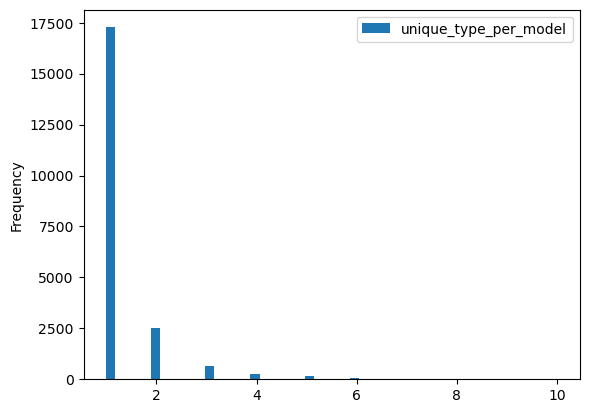

In [11]:
correlation_with_make_model('type')

-------------------------------------
Exploring the column "cylinders" with total number of null values = 177678
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237075 entries, 0 to 237074
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            237075 non-null  int64 
 1   manufacturer  237075 non-null  object
 2   model         237075 non-null  object
 3   cylinders     237075 non-null  object
 4   make_model    237075 non-null  object
dtypes: int64(1), object(4)
memory usage: 9.0+ MB
None
df_null unique model = 13075, df_short unique model = 18176, df_null - df_short unique values = 7880, df_null & df_short unique model intersection = 5196, num values that can be predicted = 134326
                    make_model  unique_cylinders_per_model
118            chevroletmalibu                           7
219               nissanaltima                           7
6126          volkswagenbeetle                 

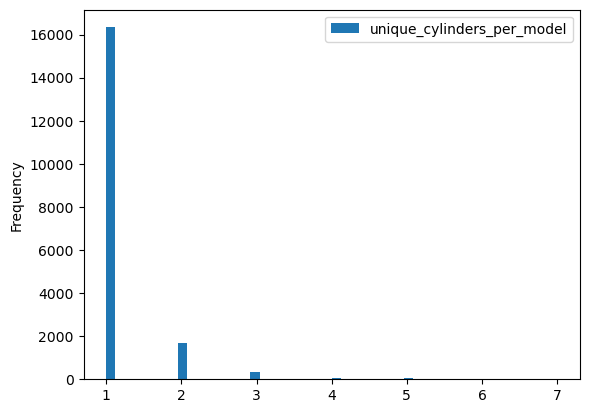

In [12]:
correlation_with_make_model('cylinders')

-------------------------------------
Exploring the column "manufacturer" with total number of null values = 17646
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404026 entries, 0 to 404025
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404026 non-null  int64 
 1   model         404026 non-null  object
 2   manufacturer  404026 non-null  object
 3   make_model    404026 non-null  object
dtypes: int64(1), object(3)
memory usage: 12.3+ MB
None
df_null unique model = 6044, df_short unique model = 23747, df_null - df_short unique values = 5903, df_null & df_short unique model intersection = 142, num values that can be predicted = 799
                    make_model  unique_manufacturer_per_model
2194                     truck                             11
4636                       van                             10
2226                    pickup                              9
975                  

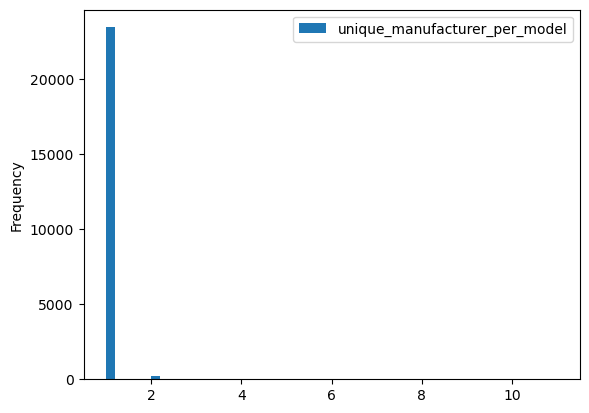

In [13]:
correlation_with_make_model('manufacturer')

In [14]:
# for col in df_short:
#     if df_short[col].dtypes == object:
#         df_short[col] = pd.factorize(df_short[col])[0]

# print_df_info(df_short)

In [15]:
# sns.heatmap(df_short.select_dtypes(include=np.number).corr(), fmt=".2f", cmap='coolwarm', square=True, linewidths=.1, cbar_kws={"shrink": .5})

In [16]:
px.box(df[df['price']<500000].dropna(subset=['paint_color']), y="price", color="paint_color")

In [17]:
px.box(df[df['price']<500000].dropna(subset=['condition']), y="price", color="condition")

#### Conclusion
* Following columns do not seem important as a feature and can be dropped
  * id
  * VIN
  * paint_color
* Correlation of multiple columns with model:
  * following columns have a lot of null
    * manufacturer: has 17.6K null values
    * cylinders: 177.6K null values
    * drive: 130.5K null values
    * size: 306.4K null values
    * type: 92.9K null values
  * The above columns seem to have strong correlation with model which leaves us with the following two approaches
    * Drop the column and let 'model' represent these columns
    * Impute the column using IterativeImputer from the 'model' column
  * We should be dropping these columns. Reason - as we can see above, the unique model values present in cases when the column as null value are very high compared to unique model values when column is non-null
    * An exception to this can be 'manufacturer' column as it has fairly less number of null values and it seems important as well. We can drop rows with null manufacturer values.
* Following columns seem important and have low number of null values. For these, null rows can be dropped
  * year
  * model
  * fuel
  * odometer
  * title_status
  * transmission
* 'condition' seems an important column and a new value of 'unknown' can be added to fillna

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [18]:
df_copy = df.copy()


In [19]:

df['cylinders'].replace('other', np.NaN, inplace=True)
df['cylinders'] = df.apply(lambda row: int(row['cylinders'].split(' ')[0]) if not pd.isnull(row['cylinders']) else row['cylinders'],
    axis=1
)
df['cylinders'].unique()

array([nan,  8.,  6.,  4.,  5.,  3., 10., 12.])

In [20]:
def fill_na_by_model(df, col):
    temp_dict = df[['model',col,'id']].dropna(subset=['model',col]).groupby(['model',col]).count().sort_values(by=['model','id'], ascending=False)['id'].to_dict()
    # print(temp_dict)  
    model_col_map = dict()
    for (model, column), val in temp_dict.items():
        if model in model_col_map.keys():
            model_col_map[model][column] = val
        else:
            model_col_map[model] = {column: val}

    def fill_col(row):
        model_val = row['model']
        col_val = row[col]
        # print('filling {}, {}'.format(model_val, col_val))
        if pd.isnull(col_val) and not pd.isnull(model_val) and model_val in model_col_map.keys():
            col_map = model_col_map[model_val]
            return max(col_map, key= lambda x: col_map[x])
        else:
            return row[col]
    # df[col] = np.where(np.isnan(df[col]) and not np.isnan(df['model']) and df['model'] in model_col_map.keys(), max(model_col_map[df['model']], key= lambda x: model_col_map[df['model']][x]), df[col])
    df[col] = df.apply(
        lambda row: fill_col(row),
        axis=1
    )
    # print(model_col_map)
    # print(df.dropna(subset=['model',col]).groupby(['model',col]).count().to_dict(orient='dict')['id'])

fill_na_by_model(df, 'drive')
fill_na_by_model(df, 'size')
fill_na_by_model(df, 'type')
fill_na_by_model(df, 'cylinders')
fill_na_by_model(df, 'manufacturer')
print_df_info(df)

total rows=426880
          column    dtype  num_null  num_unique  \
0             id    int64         0      426880   
1         region   object         0         404   
2          price    int64         0       15655   
3           year  float64      1205         115   
4   manufacturer   object     16847          43   
5          model   object      5277       29650   
6      condition   object    174104           7   
7      cylinders  float64     41755           8   
8           fuel   object      3013           6   
9       odometer  float64      4400      104871   
10  title_status   object      8242           7   
11  transmission   object      2556           4   
12           VIN   object    161042      118247   
13         drive   object     25944           4   
14          size   object     90463           5   
15          type   object     12588          14   
16   paint_color   object    130203          13   
17         state   object         0          51   

            

In [21]:
# dropping columns which aren't important
df.drop(columns=['id','VIN','paint_color'],inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        426880 non-null  object 
 1   price         426880 non-null  int64  
 2   year          425675 non-null  float64
 3   manufacturer  410033 non-null  object 
 4   model         421603 non-null  object 
 5   condition     252776 non-null  object 
 6   cylinders     385125 non-null  float64
 7   fuel          423867 non-null  object 
 8   odometer      422480 non-null  float64
 9   title_status  418638 non-null  object 
 10  transmission  424324 non-null  object 
 11  drive         400936 non-null  object 
 12  size          336417 non-null  object 
 13  type          414292 non-null  object 
 14  state         426880 non-null  object 
dtypes: float64(3), int64(1), object(11)
memory usage: 48.9+ MB


In [22]:
print_df_info(df)

total rows=426880
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       15655   
2           year  float64      1205         115   
3   manufacturer   object     16847          43   
4          model   object      5277       29650   
5      condition   object    174104           7   
6      cylinders  float64     41755           8   
7           fuel   object      3013           6   
8       odometer  float64      4400      104871   
9   title_status   object      8242           7   
10  transmission   object      2556           4   
11         drive   object     25944           4   
12          size   object     90463           5   
13          type   object     12588          14   
14         state   object         0          51   

                                        unique_values  
0   [sacramento, western maryland, fort smith, san...  
1   [30402, 33078, 4372, 928, 11788, 11490, 20859,...

In [23]:
df.dropna(subset=['year','model','fuel','odometer','title_status','transmission','manufacturer'],inplace=True)
print_df_info(df)

total rows=390323
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       14685   
2           year  float64         0         107   
3   manufacturer   object         0          41   
4          model   object         0       21861   
5      condition   object    157517           7   
6      cylinders  float64     32301           8   
7           fuel   object         0           5   
8       odometer  float64         0       99907   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object     17577           4   
12          size   object     73227           5   
13          type   object      6182          14   
14         state   object         0          51   

                                        unique_values  
0   [merced, huntington-ashland, corpus christi, a...  
1   [20688, 30594, 13765, 2795, 14480, 21275, 1565...

In [24]:
df['condition'].fillna('unknown',inplace=True)
print_df_info(df)

total rows=390323
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       14685   
2           year  float64         0         107   
3   manufacturer   object         0          41   
4          model   object         0       21861   
5      condition   object         0           7   
6      cylinders  float64     32301           8   
7           fuel   object         0           5   
8       odometer  float64         0       99907   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object     17577           4   
12          size   object     73227           5   
13          type   object      6182          14   
14         state   object         0          51   

                                        unique_values  
0   [plattsburgh-adirondacks, new hampshire, puebl...  
1   [62543, 6481, 19675, 19291, 15388, 14275, 2646...

In [25]:
# dataset 1 created by dropping all remaining null rows
df1 = df.dropna(subset=['cylinders','drive','size','type'])
print_df_info(df1)

total rows=315853
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       13913   
2           year  float64         0         105   
3   manufacturer   object         0          41   
4          model   object         0        9986   
5      condition   object         0           7   
6      cylinders  float64         0           7   
7           fuel   object         0           5   
8       odometer  float64         0       91579   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object         0           3   
12          size   object         0           4   
13          type   object         0          13   
14         state   object         0          51   

                                        unique_values  
0   [buffalo, lancaster, outer banks, nashville, l...  
1   [33997, 1168, 1116, 618, 68516, 10986, 41987, ...

In [32]:
# transform df1
transformer1 = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(),make_column_selector(dtype_include=np.number)),
        ('cat',OneHotEncoder(),make_column_selector(dtype_include=object))
    ]
)
# transformer1.set_output(transform="pandas")
transformer1

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x11dd8fcd0>),
                                ('cat', OneHotEncoder(),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x11df801d0>)])

In [33]:
X1 = df1.drop('price', axis=1)
y1 = df1['price']
transformer1.fit_transform(X1)

<315853x10526 sparse matrix of type '<class 'numpy.float64'>'
	with 4421942 stored elements in Compressed Sparse Row format>

In [41]:
# dataset 2 created by imputing columns having null values
transformer1 = ColumnTransformer(
    transformers=[
        ('numerical', StandardScaler(),make_column_selector(dtype_include=np.number)),
        ('categorical',OneHotEncoder(sparse_output=False, handle_unknown="ignore"),['drive'])
    ],
    remainder='passthrough'
)
transformer1.set_output(transform="pandas")
transformer1

ColumnTransformer(remainder='passthrough',
                  transformers=[('numerical', StandardScaler(),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x4d2d03310>),
                                ('categorical',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse_output=False),
                                 ['drive'])])

In [42]:
X = df.drop('price', axis=1)
y = df['price']
Xt = transformer1.fit_transform(X)

In [44]:
Xt.head()

,numerical__year,numerical__cylinders,numerical__odometer,categorical__drive_4wd,categorical__drive_fwd,categorical__drive_rwd,categorical__drive_nan,remainder__region,remainder__manufacturer,remainder__model,remainder__condition,remainder__fuel,remainder__title_status,remainder__transmission,remainder__size,remainder__type,remainder__state
27,0.278097,1.310185,-0.200979,1.0,0.0,0.0,0.0,auburn,gmc,sierra 1500 crew cab slt,good,gas,clean,other,NaN,pickup,al
28,-0.183692,1.310185,-0.131416,1.0,0.0,0.0,0.0,auburn,chevrolet,silverado 1500,good,gas,clean,other,full-size,pickup,al
29,0.970780,1.310185,-0.403629,1.0,0.0,0.0,0.0,auburn,chevrolet,silverado 1500 crew,good,gas,clean,other,NaN,pickup,al
30,0.624438,1.310185,-0.288803,1.0,0.0,0.0,0.0,auburn,toyota,tundra double cab sr,good,gas,clean,other,full-size,pickup,al
31,0.162650,0.064545,0.165378,0.0,0.0,1.0,0.0,auburn,ford,f-150 xlt,excellent,gas,clean,automatic,full-size,truck,al


### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.